In [620]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [621]:
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [622]:
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


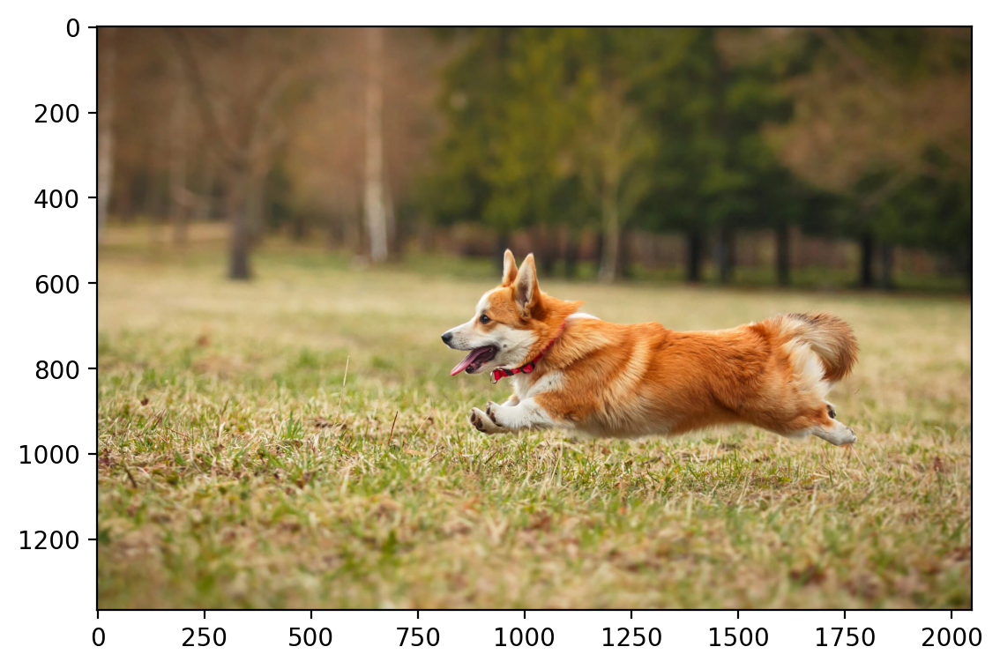

In [623]:
plt.imshow(img.permute(1, 2, 0).numpy())

In [624]:
crop = torchvision.transforms.functional.crop(img, 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

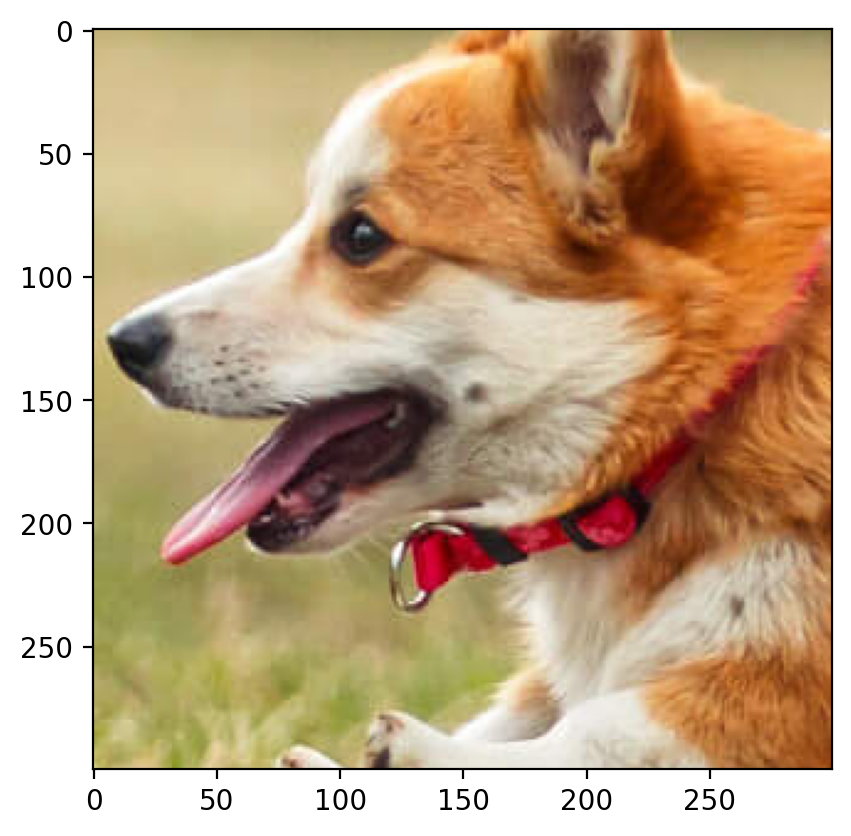

In [625]:
plt.imshow(crop.permute(1, 2, 0).numpy())

In [626]:
T = [0,60,175]
L = [0,30,90]

Text(0.5, 1.0, 'Patch 3')

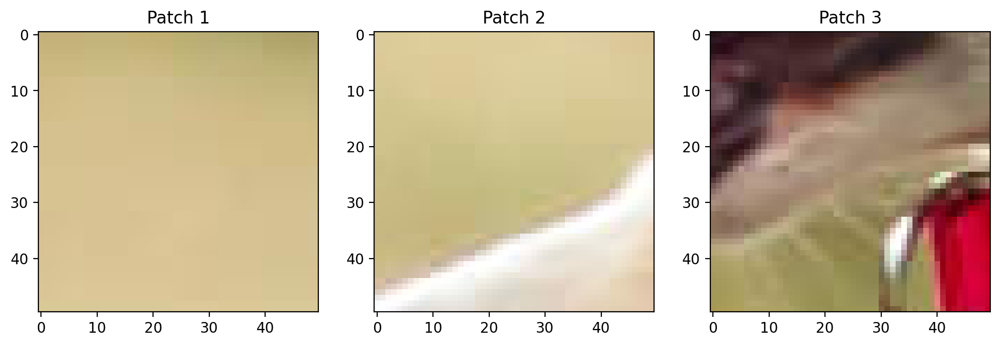

In [627]:
patch1 = torchvision.transforms.functional.crop(crop, T[0], L[0], 50, 50)
patch2 = torchvision.transforms.functional.crop(crop, T[1], L[1], 50, 50)
patch3 = torchvision.transforms.functional.crop(crop, T[2], L[2], 50, 50)
patches = [patch1,patch2,patch3]
fig, axes = plt.subplots(1, 3, figsize=(12, 4)) 
axes[0].imshow(patch1.permute(1, 2, 0).numpy())
axes[0].set_title('Patch 1')
axes[1].imshow(patch2.permute(1, 2, 0).numpy())
axes[1].set_title('Patch 2')
axes[2].imshow(patch3.permute(1, 2, 0).numpy())
axes[2].set_title('Patch 3')

In [628]:
torch.manual_seed(42)
def factorize(A, k, device=torch.device("cpu")):
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    return W, H

In [629]:
def root_mean_square_error(Actual, Compressed):
    return np.sqrt(np.mean((Actual - Compressed) ** 2))

In [630]:
def peak_signal_to_noise_ratio(Actual, Compressed):
    mse = np.mean((Actual - Compressed) ** 2)
    if mse == 0:
        return float('inf')  
    return 20 * np.log10(255.0 / np.sqrt(mse))

In [631]:
def reconstruction(red_W, red_H, green_W, green_H, blue_W, blue_H):
    r = torch.mm(red_W, red_H).detach().cpu().numpy()
    g = torch.mm(green_W, green_H).detach().cpu().numpy()
    b = torch.mm(blue_W, blue_H).detach().cpu().numpy()
    return np.stack([r, g, b], axis=2)

In [632]:
def Compress(patch, ranks, crop, x_start, y_start, patch_number):
    image_patch = patch.permute(1, 2, 0).numpy()
    for rank in ranks:
        red = torch.tensor(image_patch[:, :, 0], dtype=torch.float32)
        green = torch.tensor(image_patch[:, :, 1], dtype=torch.float32)
        blue = torch.tensor(image_patch[:, :, 2], dtype=torch.float32)

        red_W, red_H = factorize(red, rank)
        green_W, green_H = factorize(green, rank)
        blue_W, blue_H = factorize(blue, rank)
        compressed = reconstruction(red_W, red_H, green_W, green_H, blue_W, blue_H)
        rmse = root_mean_square_error(image_patch, compressed)
        psnr = peak_signal_to_noise_ratio(image_patch, compressed)
        
        crop = crop.permute(1, 2, 0).numpy()
        copied_crop = np.copy(crop)
        copied_crop[y_start:y_start + 50, x_start:x_start + 50, :] = compressed
        
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ax[0].imshow(crop / 255.0)
        ax[0].set_title('Original Image')
        ax[1].imshow(copied_crop / 255.0)
        ax[1].set_title(f'patch {patch_number} modified image with rank {rank}')
        print(f"RMSE: {rmse:.4f}, PSNR: {psnr:.2f} dB at rank {rank}")


In [633]:
ranks = [5, 10, 25, 50]

## Image patch 1

Patch 1 is relatively simple to compress as it consists of only a single color, making it a simple patch for matrix factorization. We can get good compression even on lower ranks, the RMSE is expected to be very low in this case and PSNR is expected to be higher. The single color makes it easy to predict the pattern



Text(0.5, 1.0, 'Patch1')

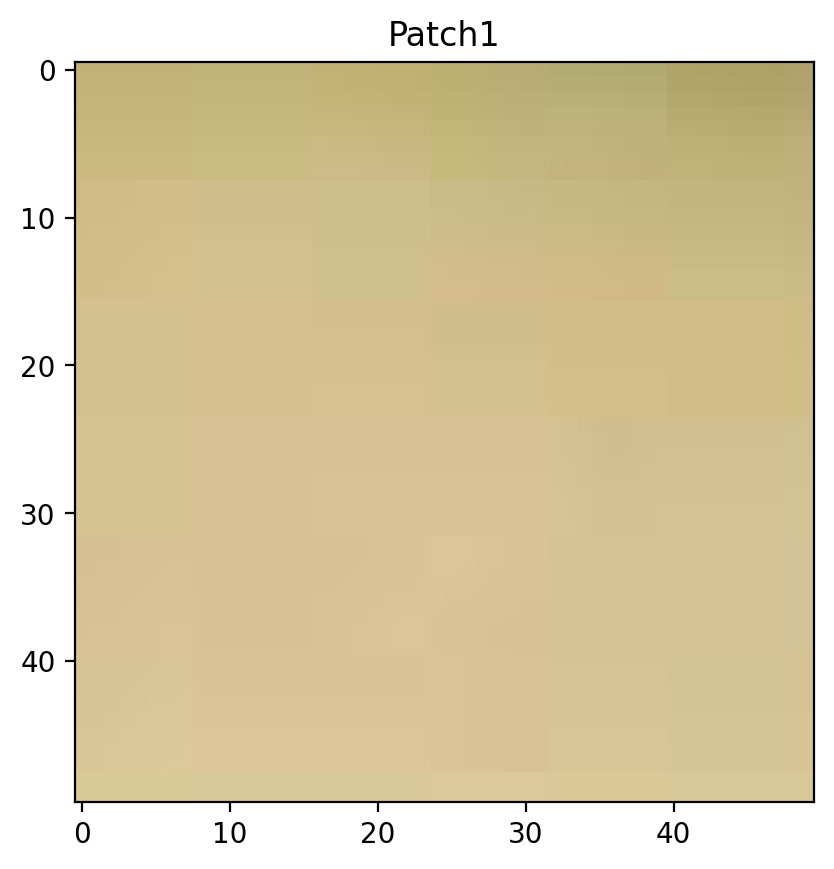

In [634]:
plt.imshow(patch1.permute(1, 2, 0).numpy())
plt.title("Patch1")

RMSE: 1.9279, PSNR: 42.43 dB at rank 5


AttributeError: 'numpy.ndarray' object has no attribute 'permute'

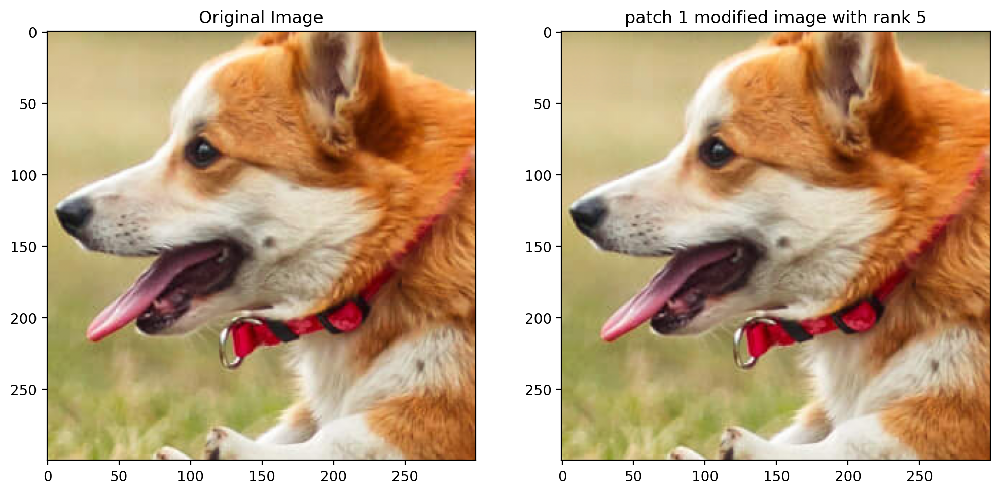

In [635]:
Compress(patches[0], ranks, crop, L[0], T[0],1)

## Image patch 2

Patch 2 consists of 2 different colors, making it somewhat difficult to factorize but still its not very difficult to predict the patterns. We can get good compression  on lower ranks while compromising quality a bit 



Text(0.5, 1.0, 'Patch2')

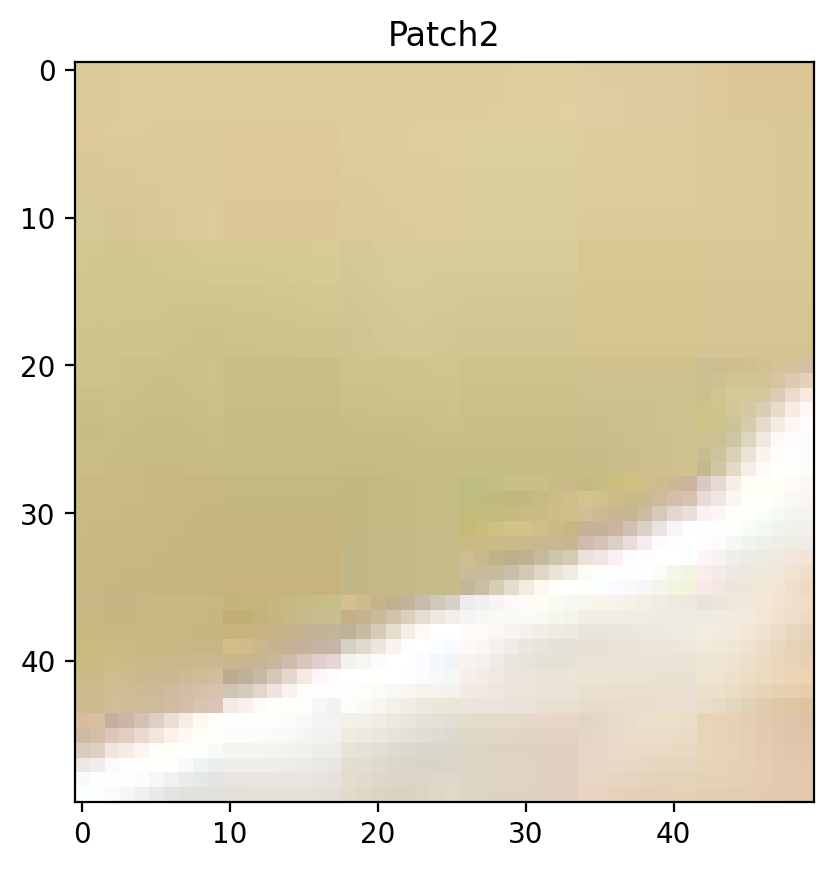

In [616]:
plt.imshow(patch2.permute(1, 2, 0).numpy())
plt.title("Patch2")

RMSE: 17.7715, PSNR: 23.14 dB at rank 5
RMSE: 9.1687, PSNR: 28.88 dB at rank 10
RMSE: 0.8321, PSNR: 49.73 dB at rank 25
RMSE: 0.1346, PSNR: 65.55 dB at rank 50


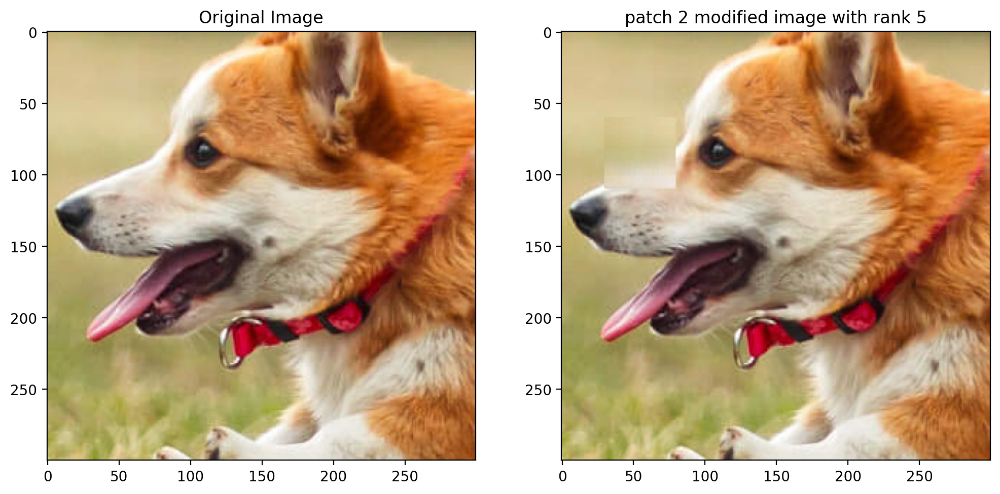

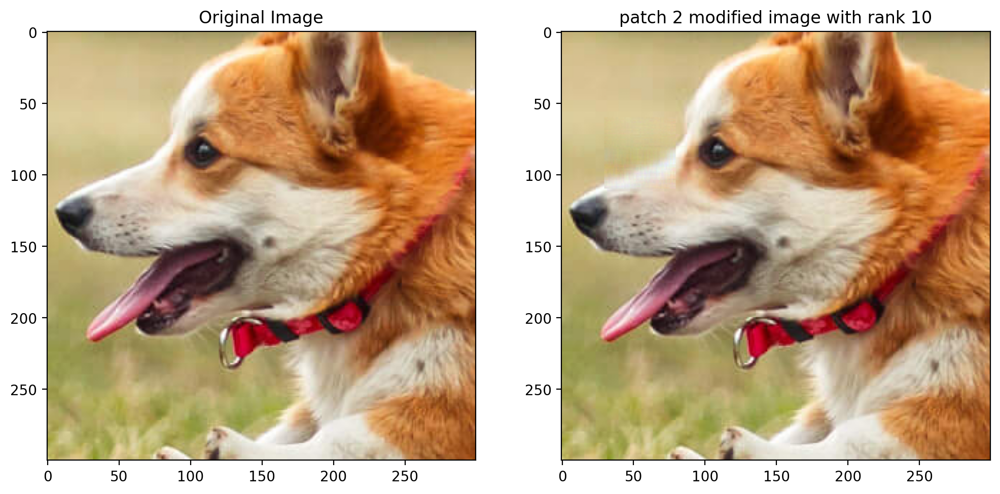

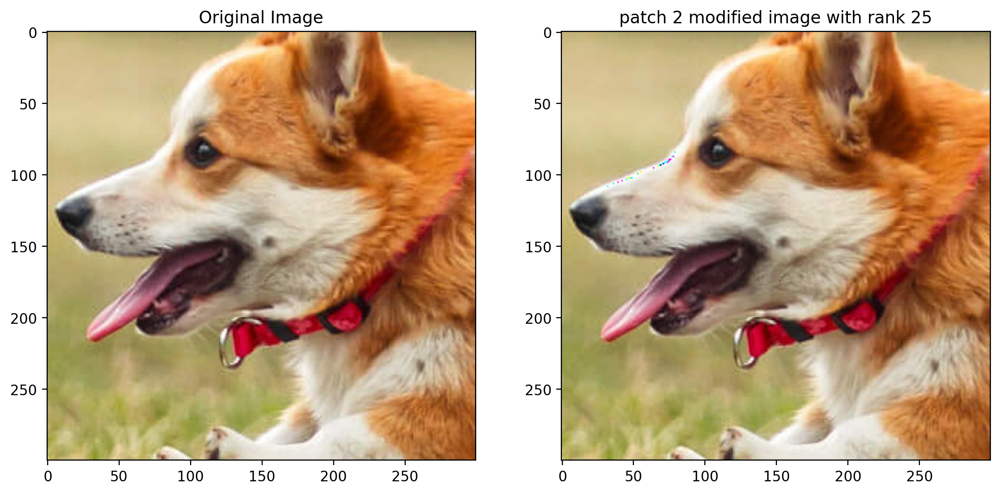

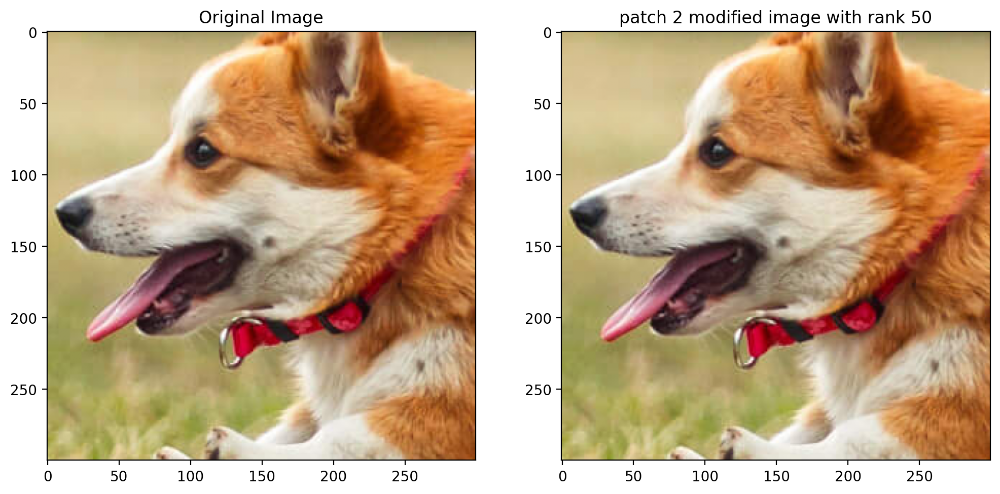

In [617]:
Compress(patches[1], ranks, crop, L[1], T[1],2)

## Image patch 3

Patch 3 consists of multiple colors, making it very difficult to factorize it at low ranks while maintaining the quality. It requires rank to be quite high to make good predictions of the original patch


Text(0.5, 1.0, 'Patch3')

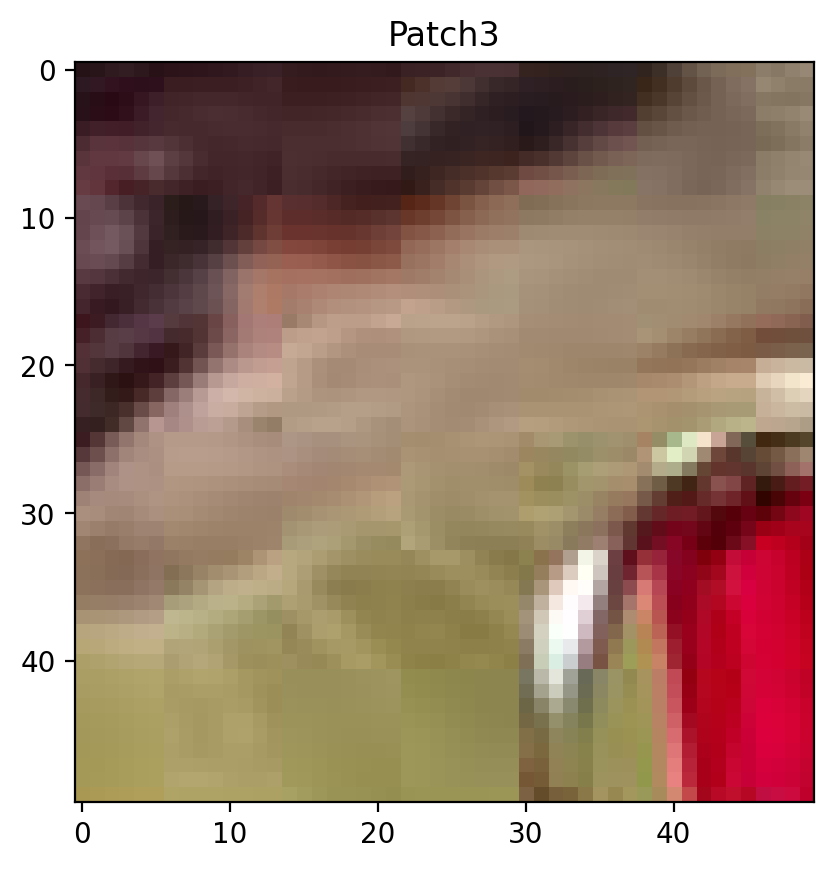

In [618]:
plt.imshow(patch3.permute(1, 2, 0).numpy())
plt.title("Patch3")

RMSE: 20.8485, PSNR: 21.75 dB at rank 5
RMSE: 10.2551, PSNR: 27.91 dB at rank 10
RMSE: 0.8017, PSNR: 50.05 dB at rank 25
RMSE: 0.0817, PSNR: 69.88 dB at rank 50


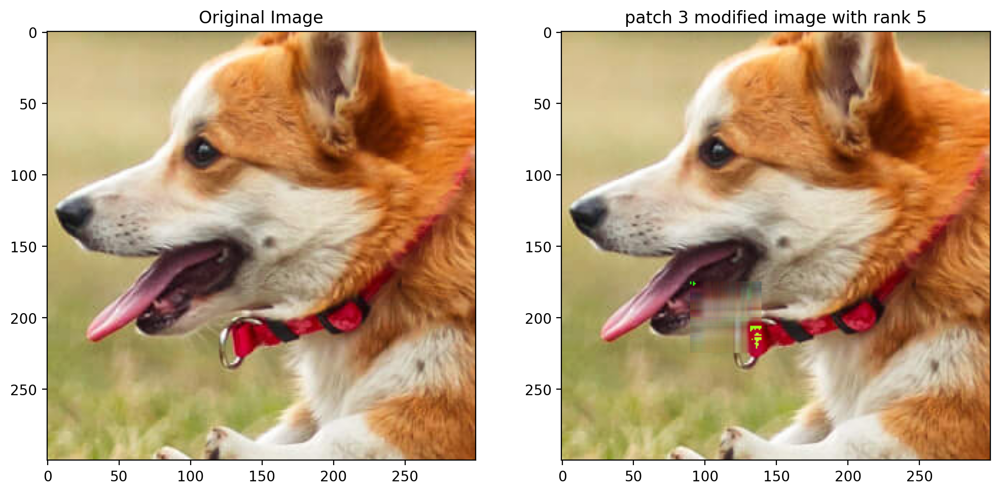

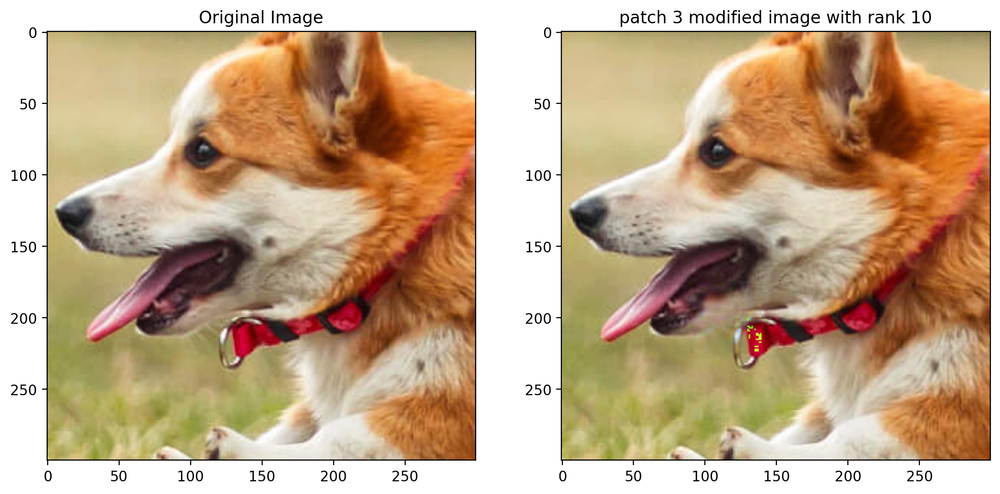

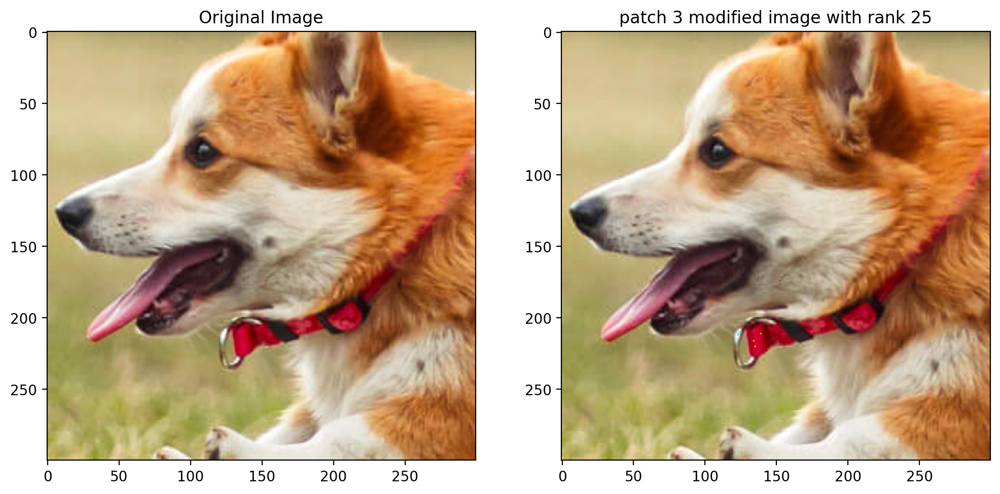

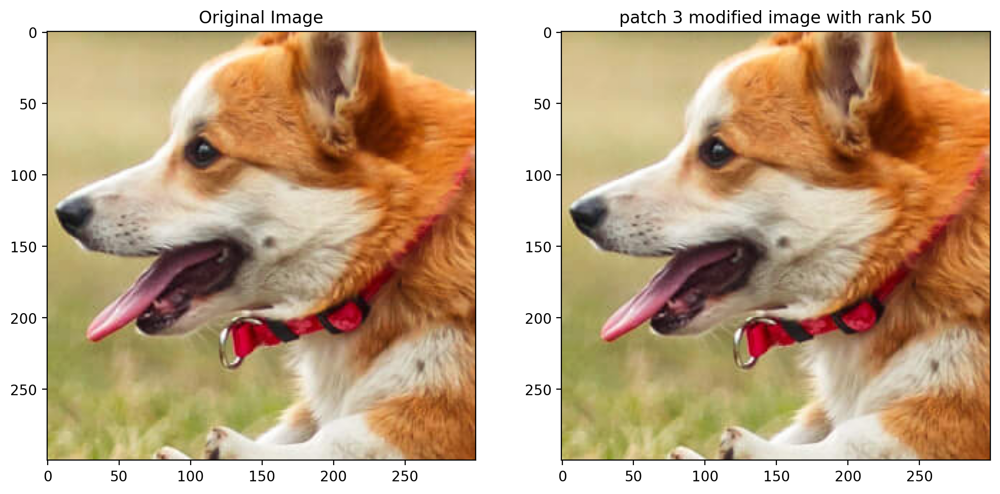

In [619]:
Compress(patches[2], ranks, crop, L[2], T[2],3)